# JPX Tokyo Stock Exchange Prediction

DISCLAIMER: The information showed in this notebook does not reflect any particular bias towards indiviudal stocks nor is this document advising investment into any of these stocks. This notebook is made purely for research and academic reasons. The solutions provided should be used at user's discretion and aware of all the risks. Use of models in a real-world setting without prior knowledge is strongly advised against.

In [1]:
# importing libraries and reading training data
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from datetime import datetime, timedelta
from decimal import ROUND_HALF_UP, Decimal

training_data=pd.read_csv("../input/jpx-tokyo-stock-exchange-prediction/train_files/stock_prices.csv", parse_dates=["Date"])
stock_list=pd.read_csv("../input/jpx-tokyo-stock-exchange-prediction/stock_list.csv")

# creating anonomised dataset
training_data[["Open", "High", "Low", "Volume", "Close"]] = training_data[["Open", "High", "Low", "Volume", "Close"]] + 1

# Data Understanding
___

This section will cover an in-depth look at the most relevant variables within the training files for model prediction.

In [2]:
print("The training data begins on {} and ends on {}.\n".format(training_data.Date.min(),training_data.Date.max()))
display(training_data.select_dtypes(include=["number"]).describe().style.format("{:,.2f}"))

The training data begins on 2017-01-04 00:00:00 and ends on 2021-12-03 00:00:00.



,SecuritiesCode,Open,High,Low,Close,Volume,AdjustmentFactor,ExpectedDividend,Target
count,"2,332,531.00","2,324,923.00","2,324,923.00","2,324,923.00","2,324,923.00","2,332,531.00","2,332,531.00","18,865.00","2,332,293.00"
mean,"5,894.84","2,595.51","2,627.54","2,562.23","2,595.02","691,937.56",1.00,22.02,0.00
std,"2,404.16","3,577.19","3,619.36","3,533.49","3,576.54","3,911,255.94",0.07,29.88,0.02
min,"1,301.00",15.00,16.00,14.00,15.00,1.00,0.10,0.00,-0.58
25%,"3,891.00","1,023.00","1,036.00","1,010.00","1,023.00","30,301.00",1.00,5.00,-0.01
50%,"6,238.00","1,813.00","1,835.00","1,791.00","1,812.00","107,101.00",1.00,15.00,0.00
75%,"7,965.00","3,031.00","3,071.00","2,996.00","3,031.00","402,101.00",1.00,30.00,0.01
max,"9,997.00","109,951.00","110,501.00","107,201.00","109,551.00","643,654,001.00",20.00,"1,070.00",1.12


In [3]:
stock_list.head(5)

,SecuritiesCode,EffectiveDate,Name,Section/Products,NewMarketSegment,33SectorCode,33SectorName,17SectorCode,17SectorName,NewIndexSeriesSizeCode,NewIndexSeriesSize,TradeDate,Close,IssuedShares,MarketCapitalization,Universe0
0,1301,20211230,"KYOKUYO CO.,LTD.",First Section (Domestic),Prime Market,50,"Fishery, Agriculture and Forestry",1,FOODS,7,TOPIX Small 2,20211230.0,3080.0,1.092828e+07,3.365911e+10,True
1,1305,20211230,Daiwa ETF-TOPIX,ETFs/ ETNs,NaN,-,-,-,-,-,-,20211230.0,2097.0,3.634636e+09,7.621831e+12,False
2,1306,20211230,NEXT FUNDS TOPIX Exchange Traded Fund,ETFs/ ETNs,NaN,-,-,-,-,-,-,20211230.0,2073.5,7.917718e+09,1.641739e+13,False
3,1308,20211230,Nikko Exchange Traded Index Fund TOPIX,ETFs/ ETNs,NaN,-,-,-,-,-,-,20211230.0,2053.0,3.736943e+09,7.671945e+12,False
4,1309,20211230,NEXT FUNDS ChinaAMC SSE50 Index Exchange Trade...,ETFs/ ETNs,NaN,-,-,-,-,-,-,20211230.0,44280.0,7.263200e+04,3.216145e+09,False


In [4]:
print("There are a total of {} unique stocks.\n".format(training_data.SecuritiesCode.nunique()))
display(stock_list.describe().style.format('{:,.2f}'))

There are a total of 2000 unique stocks.



,SecuritiesCode,EffectiveDate,TradeDate,Close,IssuedShares,MarketCapitalization
count,"4,417.00","4,417.00","4,121.00","4,121.00","4,121.00","4,121.00"
mean,"5,547.19","20,197,579.73","20,211,229.95","6,376.73","89,922,667.04","218,440,012,227.21"
std,"2,499.03","51,968.42",0.51,"38,091.52","487,167,544.35","1,309,480,999,287.26"
min,"1,301.00","20,000,101.00","20,211,216.00",1.80,"2,242.00","38,786,600.00"
25%,"3,423.00","20,211,230.00","20,211,230.00",728.00,"5,944,100.00","5,912,841,000.00"
50%,"5,711.00","20,211,230.00","20,211,230.00","1,397.00","14,950,074.00","18,225,000,000.00"
75%,"7,616.00","20,211,230.00","20,211,230.00","2,595.00","42,678,998.00","68,114,880,000.00"
max,"25,935.00","20,220,225.00","20,211,230.00","711,000.00","16,314,987,460.00","52,192,239,810,720.00"


In [5]:
training_data.head()

,RowId,Date,SecuritiesCode,Open,High,Low,Close,Volume,AdjustmentFactor,ExpectedDividend,SupervisionFlag,Target
0,20170104_1301,2017-01-04,1301,2735.0,2756.0,2731.0,2743.0,31401,1.0,NaN,False,0.000730
1,20170104_1332,2017-01-04,1332,569.0,577.0,564.0,572.0,2798501,1.0,NaN,False,0.012324
2,20170104_1333,2017-01-04,1333,3151.0,3211.0,3141.0,3211.0,270801,1.0,NaN,False,0.006154
3,20170104_1376,2017-01-04,1376,1511.0,1551.0,1511.0,1551.0,11301,1.0,NaN,False,0.011053
4,20170104_1377,2017-01-04,1377,3271.0,3351.0,3271.0,3331.0,150801,1.0,NaN,False,0.003026


## Training Data Overview

### Columns of interest:

|COL  |DESCRIPTION                         |
|-----|------------------------------------|
|Date  |The date of the stock's associated data.|
|SecuritiesCode |Each stock will be assigned a unique security code. There are 2,000 stocks or security codes. |
|Open  |The price at which the stock started at for the trading day. |
|High |The highest price the stock reached during that specific trading day. |
|Low |The lowest price the stock reached during that specific trading day. |
|Close  |The price at which the stock ended at for the trading day. |
|Volume |The volume (buying and selling) of the stock during that specific trading day. |
|AdjustmentFactor |Used to calculate stock splits and reverse splits. |
|Target |This is the target output column of the model. Selected features are used to try to calculate a value as close to the target as possible. |

# Exploratory Data Analysis - Part One
___

This section will just give an overview of the entire data set through visualisations as not all 2,000 securities are present during this entire time frame of 2017-01-04 - 2021-12-03. Part Two of EDA will be much larger, focusing on a timeframe where all stocks were recording data.

In [6]:
# JPX average returns, closing price and volume between the time periods under observation

training_date = training_data.Date.unique()
average_returns = training_data.groupby("Date")["Target"].mean().mul(100).rename("Average Return")
close_average = training_data.groupby("Date")["Close"].mean().rename("Average Closing Price")
volume_average = training_data.groupby("Date")["Volume"].mean().rename("Volume")

fig = make_subplots(rows = 3, cols = 1, shared_xaxes = True)

for i, j in enumerate([average_returns, close_average, volume_average]):
    fig.add_trace(go.Scatter(x = training_date, y = j, mode = "lines", name = j.name), row = i + 1, col = 1)

fig.update_xaxes(rangeslider_visible = False, rangeselector = dict(
    buttons = list([dict(count = 1, step = "day", label = "1D", stepmode = "backward"),
                    dict(count = 5, step = "day", label = "5D", stepmode = "backward"),
                    dict(count = 1, step = "month", label = "1M", stepmode = "backward"),
                    dict(count = 6, step = "month", label = "6M", stepmode = "backward"),
                    dict(count = 1, step = "year", label = "1Y", stepmode = "backward"),
                    dict(count = 2, step = "year", label = "2Y", stepmode = "backward"),
                    dict(step = "all")])), row = 1, col = 1)
                  
fig.update_layout(title = "JPX Market Average Stock Return, Closing Price & Volume", hovermode = "x unified", height = 600, 
                  yaxis1 = dict(title = "Avg Stock Returns", ticksuffix = "%"),
                  yaxis2 = dict(title = "Avg Closing Price"),
                  yaxis3 = dict(title = "Avg Volume"), showlegend = False)

fig.show()

Average volume is lower in 2021 compared to 2017 but average closing price is higher, meaning the stock market's value increased despite lower volume.

In [7]:
# yearly average stock returns by sector

stock_list["Sector"] = [i.rstrip().lower().capitalize() for i in stock_list["17SectorName"]]
stock_list["Name"] = [i.rstrip().lower().capitalize() for i in stock_list["Name"]]
training_data = training_data.merge(stock_list[["SecuritiesCode", "Name", "Sector"]], on = "SecuritiesCode", how = "left")

training_data["Year"] = training_data["Date"].dt.year
return_average = training_data.groupby(["Sector","Year"])["Target"].mean().mul(100).reset_index(name="AverageReturn")
years = return_average["Year"].unique()
years.sort()

fig = make_subplots(rows = 1, cols = 5, shared_yaxes = True)

for i, year in enumerate(years):
    year_data = return_average[return_average["Year"] == year]
    negative = year_data["AverageReturn"] <= 0
    fig.add_trace(go.Bar(x = year_data["AverageReturn"][negative], y = year_data["Sector"][negative], orientation = "h",
                        text = year_data["AverageReturn"][negative], texttemplate = "%{text:.2f}%", textposition = "auto",
                        hovertemplate = "Average return in %{y} = %{x:.4f}%",
                        marker = dict(color = "red", opacity = 0.85), name = str(year)), row = 1, col = i + 1)
    
    fig.add_trace(go.Bar(x = year_data["AverageReturn"][~negative], y = year_data["Sector"][~negative], orientation = "h",
                        text = year_data["AverageReturn"][~negative], texttemplate = "%{text:.2f}%", textposition = "auto",
                        hovertemplate = "Average returns in %{y} = %{x:.4f}%",
                        marker = dict(color = "green", opacity = 0.85), name = str(year)), row = 1, col = i + 1)
    
    fig.update_xaxes(title = f"{year}", row = 1, col = i + 1)

fig.update_layout(template = "simple_white", title = "Yearly Average Returns by Sector", hovermode = "closest",
                 height = 600, showlegend = False)
                         
fig.show()

In [8]:
# Yearly average closing price by sector

close_average = training_data.groupby(["Sector","Year"])["Close"].mean().reset_index(name="Close")
years = close_average["Year"].unique()
years.sort()

fig = make_subplots(rows = 1, cols = 5, shared_yaxes = True)

for i, year in enumerate(years):
    year_data = close_average[close_average["Year"] == year]
    fig.add_trace(go.Bar(x = year_data["Close"], y = year_data["Sector"], orientation = "h",
                        text = year_data["Close"], texttemplate = "%{text:.2s}", textposition = "auto",
                        hovertemplate = "Average closing price in %{y} = %{x:.4s}",
                        marker = dict(color = "green", opacity = 0.8), name = str(year)), row = 1, col = i + 1)
    fig.update_xaxes(title = f"{year}", row = 1, col = i + 1)

fig.update_layout(template = "simple_white", title = "Yearly Average Closing Price by Sector", hovermode = "closest",
                 height = 600, showlegend = False)
                         
fig.show()

In [9]:
# Yearly average volume by sector

volume_average = training_data.groupby(["Sector","Year"])["Volume"].mean().reset_index(name="Volume")
years = volume_average["Year"].unique()
years.sort()

fig = make_subplots(rows = 1, cols = 5, shared_yaxes = True)

for i, year in enumerate(years):
    year_data = volume_average[volume_average["Year"] == year]
    fig.add_trace(go.Bar(x = year_data["Volume"], y = year_data["Sector"], orientation = "h",
                        text = year_data["Volume"], texttemplate = "%{text:.2s}", textposition = "auto",
                        hovertemplate = "Average volume in %{y} = %{x:.4s}",
                        marker = dict(color = "blue", opacity = 0.6), name = str(year)), row = 1, col = i + 1)
    fig.update_xaxes(title = f"{year}", row = 1, col = i + 1)

fig.update_layout(template = "simple_white", title = "Yearly Average Volume by Sector", hovermode = "closest",
                 height = 600, showlegend = False)
                         
fig.show()

In [10]:
# Trading days the market performed positively or negatively by average returns

average_returns = training_data.groupby("Date")["Target"].mean().mul(100).rename("Average Return")
average_returns["Return Column"] = average_returns.apply(lambda x: "Positive" if x >= 0 else "Negative")
count_total = len(average_returns)
count_positive = (average_returns["Return Column"] == "Positive").sum()
count_negative = (average_returns["Return Column"] == "Negative").sum()

pie_data = pd.DataFrame({
    "Return Column":["Positive", "Negative"],
    "Count":[count_positive, count_negative]
})

fig = px.pie(pie_data, names = "Return Column", color = "Return Column", values = "Count", 
            title = "Distribution of Stocks Averaging Positive or Negative Returns",
            color_discrete_map={"Positive": "green", "Negative": "red"},
            opacity = 0.85)

fig.update_traces(textinfo = "percent+label")

fig.update_layout(width = 600)

fig.show()

# Exploratory Data Analysis - Part Two
---

Not all stocks were added until 23/12/2020, so I will start from this date for most Exploratory Data Analysis to visualise a representation of the data where all stocks are included during the same time frame. This cuts down the data rows from 2.3m to 462k, making the visualisations created to be much less laggy and smoother as less data will be processed and visualised. This also allows more visualisations within the notebook without performance issues.

In [11]:
training_data = training_data[training_data.Date > "2020-12-23"]
print("New training data consists of 2000 stocks over a 231 day time frame (24/12/2020 to 03/12/2021).")
print(training_data.shape)
print("Missing values in column of interest, Target = ", training_data["Target"].isna().sum())

display(training_data.head(), training_data.tail())

New training data consists of 2000 stocks over a 231 day time frame (24/12/2020 to 03/12/2021).
(462000, 15)
Missing values in column of interest, Target =  0


,RowId,Date,SecuritiesCode,Open,High,Low,Close,Volume,AdjustmentFactor,ExpectedDividend,SupervisionFlag,Target,Name,Sector,Year
1870531,20201224_1301,2020-12-24,1301,2914.0,2938.0,2910.0,2918.0,13901,1.0,NaN,False,0.011660,"Kyokuyo co.,ltd.",Foods,2020
1870532,20201224_1332,2020-12-24,1332,422.0,427.0,420.0,421.0,1385001,1.0,NaN,False,-0.007092,"Nippon suisan kaisha,ltd.",Foods,2020
1870533,20201224_1333,2020-12-24,1333,2183.0,2200.0,2171.0,2179.0,102401,1.0,NaN,False,0.007766,Maruha nichiro corporation,Foods,2020
1870534,20201224_1375,2020-12-24,1375,1763.0,1768.0,1704.0,1723.0,242701,1.0,NaN,False,-0.015152,"Yukiguni maitake co.,ltd.",Foods,2020
1870535,20201224_1376,2020-12-24,1376,1580.0,1581.0,1571.0,1581.0,3001,1.0,NaN,False,-0.008307,"Kaneko seeds co.,ltd.",Foods,2020


,RowId,Date,SecuritiesCode,Open,High,Low,Close,Volume,AdjustmentFactor,ExpectedDividend,SupervisionFlag,Target,Name,Sector,Year
2332526,20211203_9990,2021-12-03,9990,515.0,529.0,514.0,529.0,44201,1.0,NaN,False,0.034816,Sac's bar holdings inc.,Retail trade,2021
2332527,20211203_9991,2021-12-03,9991,783.0,795.0,783.0,795.0,35901,1.0,NaN,False,0.025478,Gecoss corporation,Commercial & wholesale trade,2021
2332528,20211203_9993,2021-12-03,9993,1691.0,1691.0,1646.0,1646.0,7201,1.0,NaN,False,-0.004302,"Yamazawa co.,ltd.",Retail trade,2021
2332529,20211203_9994,2021-12-03,9994,2389.0,2397.0,2381.0,2390.0,6501,1.0,NaN,False,0.009098,Yamaya corporation,Retail trade,2021
2332530,20211203_9997,2021-12-03,9997,691.0,712.0,687.0,697.0,381101,1.0,NaN,False,0.018414,"Belluna co.,ltd.",Retail trade,2021


/opt/conda/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



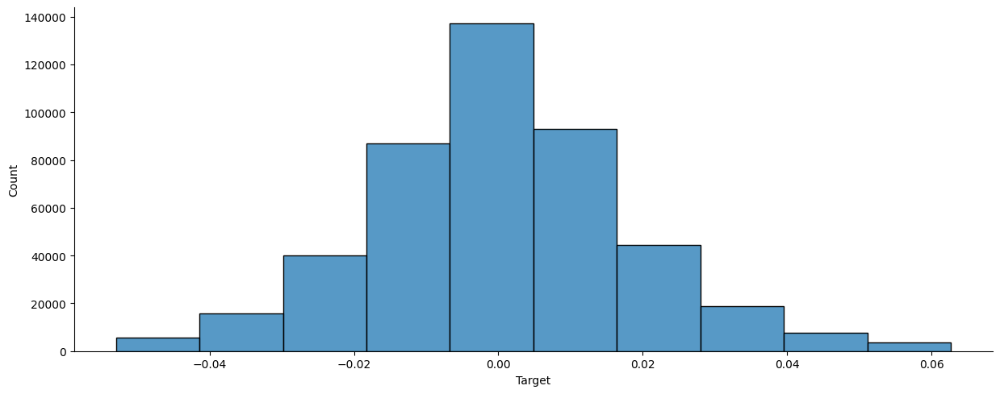

In [12]:
# Target column distribution

upper_percentile = training_data["Target"].quantile(0.99)
lower_percentile = training_data["Target"].quantile(0.01)
df = training_data[(training_data["Target"] < upper_percentile) & (training_data["Target"] > lower_percentile)]

sns.displot(df["Target"], aspect = 2.5, kde = False, bins = 10)

<Axes: ylabel='Target'>

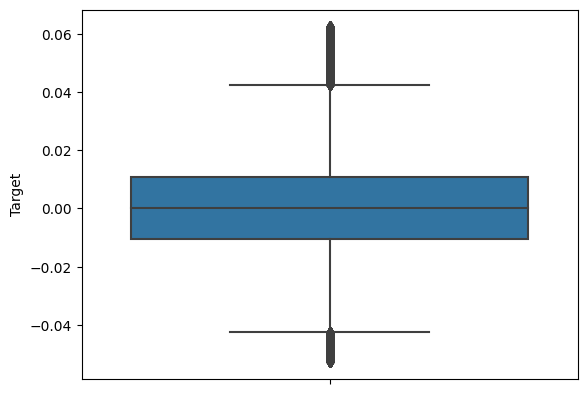

In [13]:
sns.boxplot(y = df["Target"])

In [14]:
# Returns distribution by sector boxplot
sectors = training_data["Sector"].unique()

fig = go.Figure()

for sector in sectors:
    y = training_data[training_data["Sector"] == sector]["Target"] * 100
    fig.add_trace(go.Box(y = y, name = sector))
    
fig.update_layout(title = "Returns Distribution by Sector", yaxis = dict(title = "Return", ticksuffix = "%"), height = 700)

fig.show()

In [15]:
# Trading days the market performed positively or negatively by average returns

average_returns = training_data.groupby("Date")["Target"].mean().mul(100).rename("Average Return")
average_returns["Return Column"] = average_returns.apply(lambda x: "Positive" if x >= 0 else "Negative")
count_total = len(average_returns)
count_positive = (average_returns["Return Column"] == "Positive").sum()
count_negative = (average_returns["Return Column"] == "Negative").sum()

pie_data = pd.DataFrame({
    "Return Column":["Positive", "Negative"],
    "Count":[count_positive, count_negative]
})

fig = px.pie(pie_data, names = "Return Column", color = "Return Column", values = "Count", 
            title = "Distribution of Stocks Averaging Positive or Negative Returns",
            color_discrete_map={"Positive": "green", "Negative": "red"},
            opacity = 0.85)

fig.update_traces(textinfo = "percent+label")

fig.update_layout(width = 600)

fig.show()

In [16]:
# pie chart showing each sector's volume

total_volume = training_data["Volume"].sum()
pie_df = training_data.groupby("Sector")["Volume"].sum().reset_index()

pie_data = pd.DataFrame({
    "Sector": pie_df["Sector"],
    "Volume": pie_df["Volume"]
})

fig = px.pie(pie_data, names = "Sector", values = "Volume",
             title = "JPX Market Sector Volume Distribution")

fig.update_traces(hovertemplate = "%{label}<br>Volume: %{value:.4s} (Billion)", textinfo = "percent+label")

fig.show()

In [17]:
# top 5 and bottom 5 stocks by returns in each sector and out of all sectors

# finding top and bottom 5 stocks by returns
stock_returns = training_data.groupby(["Name", "Sector"])["Target"].mean().mul(100)
top_5_all = stock_returns.nlargest(5, "all").reset_index(name = "Return")
bottom_5_all = stock_returns.nsmallest(5, "all").reset_index(name = "Return")
sector_all = pd.concat([top_5_all, bottom_5_all])
sector_all["Sector"] = "All"

sector_df = [sector_all]

for sector in sectors:
    sector_data = stock_returns[stock_returns.index.get_level_values("Sector") == sector]
    top_5 = sector_data.nlargest(5, "all").reset_index(name = "Return")
    bottom_5 = sector_data.nsmallest(5, "all").reset_index(name = "Return")
    top_bottom_5 = pd.concat([top_5, bottom_5])
    sector_df.append(top_bottom_5)

all_sector_data = pd.concat(sector_df)

fig = go.Figure()
buttons = []
negative = sector_all["Return"] <= 0

fig.add_trace(go.Bar(x = sector_all["Name"][~negative], y = sector_all["Return"][~negative],
                     text = sector_all["Return"][~negative], texttemplate = "%{text:.2f}%",
                     textposition = "auto", hovertemplate = "%{x}, Average Return: %{y:.4f}%",
                     marker = dict(color = "green", opacity = 0.85)))

fig.add_trace(go.Bar(x = sector_all["Name"][negative], y = sector_all["Return"][negative],
                     text = sector_all["Return"][negative], texttemplate = "%{text:.2f}%",
                     textposition = "auto", hovertemplate = "%{x}, Average Return: %{y:.4f}%",
                     marker = dict(color = "red", opacity = 0.85)))

for sector in ["All"] + list(sectors):
    sector_data = all_sector_data[all_sector_data["Sector"] == sector]
    buttons.append(dict(method="update", label = sector, visible = True, 
                         args = [{"x": [sector_data["Name"][~negative], sector_data["Name"][negative]],
                                  "y": [sector_data["Return"][~negative], sector_data["Return"][negative]],
                                  "text": [sector_data["Return"][~negative], sector_data["Return"][negative]]}]))

fig.update_layout(title = "Top 5 and Bottom 5 Stocks by Sector by Average Returns",
                  showlegend = False, hovermode = "closest", yaxis = dict(title = "Return", ticksuffix = "%"),
                  height = 650,
                  width = 1080,
                  updatemenus = [dict(buttons = buttons,
                                      type = "dropdown",
                                      active = 0,
                                      xanchor = "left",
                                      yanchor = "bottom",
                                      x = 0, y = 1.025)])
                  
fig.show()

In [18]:
# ALL CATEGORY NEEDS FIXING
# top 5 and bottom 5 stocks by avgerage volume in each sector

stock_volumes = training_data.groupby(["Name", "Sector"])["Volume"].mean()
top_5_all = stock_volumes.nlargest(5, "all").reset_index(name = "Volume")
bottom_5_all = stock_volumes.nsmallest(5, "all").reset_index(name = "Volume")
sector_all = pd.concat([top_5_all, bottom_5_all])
sector_all["Sector"] = "All"

sectors = training_data["Sector"].unique()
sector_df = [sector_all]

for sector in sectors:
    sector_data = stock_volumes[stock_volumes.index.get_level_values("Sector") == sector]
    top_5 = sector_data.nlargest(5, "all").reset_index(name = "Volume")
    bottom_5 = sector_data.nsmallest(5, "all").reset_index(name = "Volume")
    top_bottom_5 = pd.concat([top_5, bottom_5])
    sector_df.append(top_bottom_5)

all_sector_data = pd.concat(sector_df)

fig = go.Figure()
buttons = []

fig.add_trace(go.Bar(x = sector_all["Name"], y = sector_all["Volume"],
                     text = sector_all["Volume"], texttemplate = "%{text:.3s}",
                     textposition = "auto", hovertemplate = "%{x}, Average Volume: %{y:.4s}",
                     marker = dict(color = "blue", opacity = 0.85)))

for sector in ["All"] + list(sectors):
    sector_data = all_sector_data[all_sector_data["Sector"] == sector]
    buttons.append(dict(method="update", label = sector, visible = True, 
                         args = [{"x": [sector_data["Name"]],
                                  "y": [sector_data["Volume"]],
                                  "text": [sector_data["Volume"]]}]))

fig.update_layout(title = "Top 5 and Bottom 5 Stocks by Sector by Average Volume",
                  showlegend = False, hovermode = "closest", yaxis = dict(title = "Volume"),
                  height = 700,
                  updatemenus = [dict(buttons = buttons,
                                      type = "dropdown",
                                      active = 0,
                                      xanchor = "left",
                                      yanchor = "bottom",
                                      x = 0, y = 1.025)])
                  
fig.show()

In [19]:
# top 5 average returns out of all stocks

# calculating mean target % value for each stock on each unique date
df = training_data.groupby(["SecuritiesCode", "Date", "Name", "Sector"])["Target"].mean().mul(100).reset_index()
df_top5 = df[df["Name"].isin(top_5["Name"])]

fig = make_subplots(rows=5, cols=1, subplot_titles=str(top_5["Name"]))

for i, j in enumerate(top_5["Name"]):
    stock_data = df_top5[df_top5["Name"] == j]
    fig.add_trace(go.Scatter(x=stock_data["Date"], y=stock_data["Target"], mode = "lines", name = j), row=i+1, col=1)

fig.update_xaxes(rangeslider_visible = False, rangeselector = dict(
    buttons = list([dict(count = 1, step = "day", label = "1D", stepmode = "backward"),
                    dict(count = 5, step = "day", label = "5D", stepmode = "backward"),
                    dict(count = 1, step = "month", label = "1M", stepmode = "backward"),
                    dict(step = "all")])), row = 1, col = 1)

fig.update_layout(title = "Overall Top 5 Performing Stocks by Daily Average Returns", hovermode = "x unified", height = 700, 
                  yaxis1 = dict(ticksuffix = "%"),
                  yaxis2 = dict(ticksuffix = "%"),
                  yaxis3 = dict(ticksuffix = "%"),
                  yaxis4 = dict(ticksuffix = "%"),
                  yaxis5 = dict(ticksuffix = "%"),
                  showlegend = True)

fig.show()

In [20]:
# bottom 5 average returns out of all stocks

df_bottom5 = df[df["Name"].isin(bottom_5["Name"])]

fig = make_subplots(rows=5, cols=1, subplot_titles=str(bottom_5["Name"]))

for i, j in enumerate(bottom_5["Name"]):
    stock_data = df_bottom5[df_bottom5["Name"] == j]
    fig.add_trace(go.Scatter(x=stock_data["Date"], y=stock_data["Target"], mode = "lines", name = j), row=i+1, col=1)

fig.update_xaxes(rangeslider_visible = False, rangeselector = dict(
    buttons = list([dict(count = 1, step = "day", label = "1D", stepmode = "backward"),
                    dict(count = 5, step = "day", label = "5D", stepmode = "backward"),
                    dict(count = 1, step = "month", label = "1M", stepmode = "backward"),
                    dict(step = "all")])), row = 1, col = 1)
    
fig.update_layout(title = "Overall Worst 5 Performing Stocks by Daily Average Returns", hovermode = "x unified", height = 700, 
                  yaxis1 = dict(ticksuffix = "%"),
                  yaxis2 = dict(ticksuffix = "%"),
                  yaxis3 = dict(ticksuffix = "%"),
                  yaxis4 = dict(ticksuffix = "%"),
                  yaxis5 = dict(ticksuffix = "%"),
                  showlegend = True)

fig.show()

In [21]:
training_data

,RowId,Date,SecuritiesCode,Open,High,Low,Close,Volume,AdjustmentFactor,ExpectedDividend,SupervisionFlag,Target,Name,Sector,Year
1870531,20201224_1301,2020-12-24,1301,2914.0,2938.0,2910.0,2918.0,13901,1.0,NaN,False,0.011660,"Kyokuyo co.,ltd.",Foods,2020
1870532,20201224_1332,2020-12-24,1332,422.0,427.0,420.0,421.0,1385001,1.0,NaN,False,-0.007092,"Nippon suisan kaisha,ltd.",Foods,2020
1870533,20201224_1333,2020-12-24,1333,2183.0,2200.0,2171.0,2179.0,102401,1.0,NaN,False,0.007766,Maruha nichiro corporation,Foods,2020
1870534,20201224_1375,2020-12-24,1375,1763.0,1768.0,1704.0,1723.0,242701,1.0,NaN,False,-0.015152,"Yukiguni maitake co.,ltd.",Foods,2020
1870535,20201224_1376,2020-12-24,1376,1580.0,1581.0,1571.0,1581.0,3001,1.0,NaN,False,-0.008307,"Kaneko seeds co.,ltd.",Foods,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2332526,20211203_9990,2021-12-03,9990,515.0,529.0,514.0,529.0,44201,1.0,NaN,False,0.034816,Sac's bar holdings inc.,Retail trade,2021
2332527,20211203_9991,2021-12-03,9991,783.0,795.0,783.0,795.0,35901,1.0,NaN,False,0.025478,Gecoss corporation,Commercial & wholesale trade,2021
2332528,20211203_9993,2021-12-03,9993,1691.0,1691.0,1646.0,1646.0,7201,1.0,NaN,False,-0.004302,"Yamazawa co.,ltd.",Retail trade,2021
2332529,20211203_9994,2021-12-03,9994,2389.0,2397.0,2381.0,2390.0,6501,1.0,NaN,False,0.009098,Yamaya corporation,Retail trade,2021


In [22]:
# Average close price comparison between start and end of time frame

fig = go.Figure()

for sector in sectors:
    start_close = training_data[(training_data["Sector"] == sector) & (training_data["Date"] == "2020-12-24")]["Close"].mean()
    end_close = training_data[(training_data["Sector"] == sector) & (training_data["Date"] == "2021-12-03")]["Close"].mean()
    
    fig.add_trace(go.Bar(x = [f"{sector} Start", f"{sector} End"], y = [start_close, end_close], name = sector))
    
    
fig.update_layout(title = "Average Close Price by Sector at Beginning and End Date",
                  yaxis = dict(title = "Close Price"), height = 700, width = 1080, barmode = "group")

fig.show()

# Feature Engineering
___

This section will focus on creating additional features which will be used in the prediction model. The features will be created from the main columns of interest which are: "Close", "Open", "High", "Low" and "Volume". The "Target" Column will be used to compare the prediction result of the model against the actual result. These features will be created using the entire data set rather than the 231 trading days where all securities are included. This is to build features and feed the model with as much data as possible, attempting to reach a higher model performance score.

The code below is provided by the Kaggle competition hosts in the [Train Demo Notebook](https://www.kaggle.com/code/smeitoma/train-demo#Generating-AdjustedClose-price). This code calculates the adjusted close price using the AdjustmentFacort column in the training dataset. It's purpose is adjusting the closing price accordingly when stock splits or reverse splits occur within a company's stock.

In [23]:
# code provided from Kaggle competition

def adjust_price(price):
    """
    Args:
        price (pd.DataFrame)  : pd.DataFrame include stock_price
    Returns:
        price DataFrame (pd.DataFrame): stock_price with generated AdjustedClose
    """
    # transform Date column into datetime
    price.loc[: ,"Date"] = pd.to_datetime(price.loc[: ,"Date"], format="%Y-%m-%d")

    def generate_adjusted_close(df):
        """
        Args:
            df (pd.DataFrame)  : stock_price for a single SecuritiesCode
        Returns:
            df (pd.DataFrame): stock_price with AdjustedClose for a single SecuritiesCode
        """
        # sort data to generate CumulativeAdjustmentFactor
        df = df.sort_values("Date", ascending=False)
        # generate CumulativeAdjustmentFactor
        df.loc[:, "CumulativeAdjustmentFactor"] = df["AdjustmentFactor"].cumprod()
        # generate AdjustedClose
        df.loc[:, "AdjustedClose"] = (
            df["CumulativeAdjustmentFactor"] * df["Close"]
        ).map(lambda x: float(
            Decimal(str(x)).quantize(Decimal('0.1'), rounding=ROUND_HALF_UP)
        ))
        # reverse order
        df = df.sort_values("Date")
        # to fill AdjustedClose, replace 0 into np.nan
        df.loc[df["AdjustedClose"] == 0, "AdjustedClose"] = np.nan
        # forward fill AdjustedClose
        df.loc[:, "AdjustedClose"] = df.loc[:, "AdjustedClose"].ffill()
        return df

    # generate AdjustedClose
    price = price.sort_values(["SecuritiesCode", "Date"])
    price = price.groupby("SecuritiesCode").apply(generate_adjusted_close).reset_index(drop=True)

    price.set_index("Date", inplace=True)
    return price

In [24]:
df_price = pd.read_csv("/kaggle/input/jpx-tokyo-stock-exchange-prediction/train_files/stock_prices.csv")
df_price = adjust_price(df_price)

In [25]:
# will use these time periods for calculations of price change, moving averages, volatility, etc over the past 1, 5, 10, 20, 50, 100 and 200 previous
# trading days
periods = [1, 5, 10, 20, 50, 100, 200]
# first security in data frame selected to show visual examples of the new features created
example = df_price.loc[df_price["SecuritiesCode"] == 1301].copy()

In [26]:
# past price change

price_change = []
for period in periods:
    price_change.append(f"price_change {period}")
    example.loc[:, f"price_change {period}"] = example["AdjustedClose"].pct_change(period)

<Axes: title={'center': 'Past Price Change, Securitiy 1301'}, xlabel='Date'>

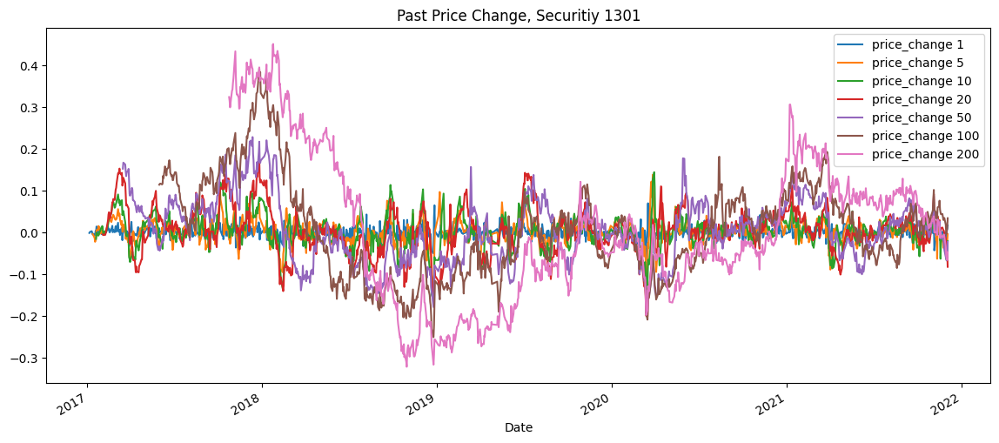

In [27]:
# visualising price change
example[price_change].plot(figsize = (14, 6), title = "Past Price Change, Securitiy 1301")

In [28]:
# future price change

future_price_change = []
for period in periods: 
    future_price_change.append(f"future_price_change {period}")
    example.loc[:, f"future_price_change {period}"] = example["AdjustedClose"].shift(-period) / example["AdjustedClose"] - 1

<Axes: title={'center': 'Future Price Change, Securitiy 1301'}, xlabel='Date'>

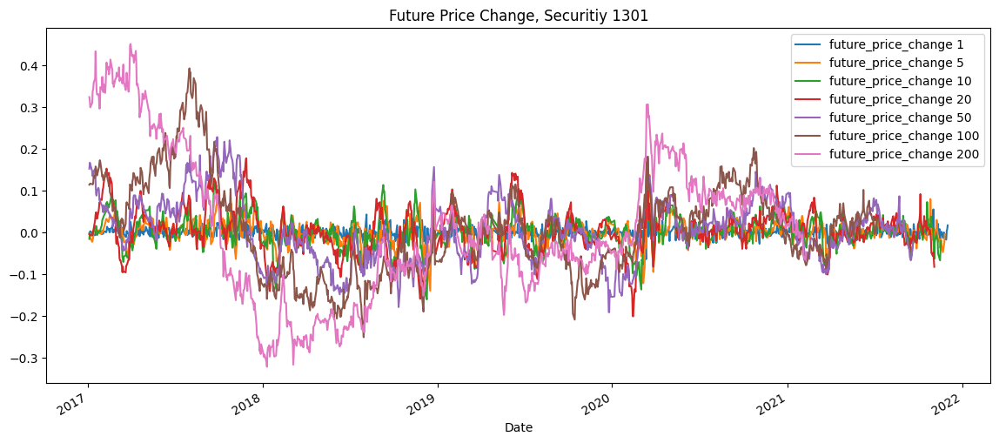

In [29]:
# visualising future price change
example[future_price_change].plot(figsize = (14, 6), title = "Future Price Change, Securitiy 1301")

In [30]:
# volatility

volatility = []
for period in periods:
    volatility.append(f"volatility {period}")
    example.loc[:, f"volatility {period}"] = np.log(example["AdjustedClose"]).diff().rolling(period).std()

<Axes: title={'center': 'Historical Volatility, Securitiy 1301'}, xlabel='Date'>

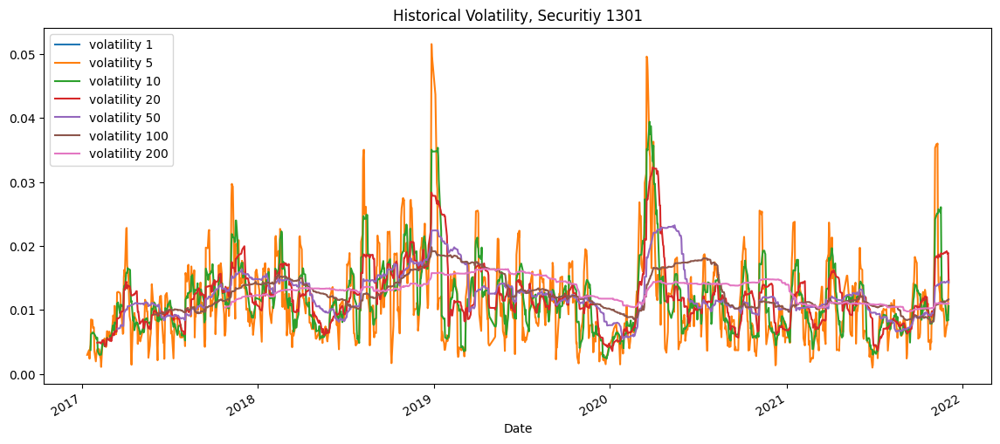

In [31]:
# visualisation of volatility
example[volatility].plot(figsize = (14, 6), title = "Historical Volatility, Securitiy 1301")

In [32]:
# Simple moving averages, 5, 10, 20, 50, 100

simple_moving_average = []
for period in periods:
    simple_moving_average.append(f"simple_moving_average {period}")
    example.loc[:, f"simple_moving_average {period}"] = example["AdjustedClose"].rolling(window = period).mean()

<Axes: title={'center': 'Simple Moving Averages, Securitiy 1301'}, xlabel='Date'>

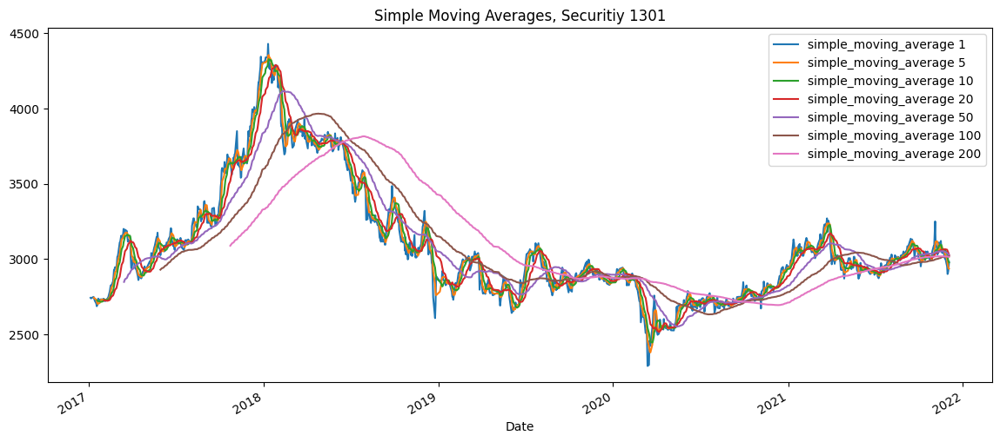

In [33]:
# simple moving averages visualisation
example[simple_moving_average].plot(figsize = (14, 6), title = "Simple Moving Averages, Securitiy 1301")

In [34]:
# Exponential moving averages, 5, 10, 20, 50, 100

exponential_moving_average = []
for period in periods:
    exponential_moving_average.append(f"exponential_moving_average {period}")
    example.loc[:, f"exponential_moving_average {period}"] = example["AdjustedClose"].ewm(span = period, adjust = False).mean()

<Axes: title={'center': 'Exponential Moving Averages, Securitiy 1301'}, xlabel='Date'>

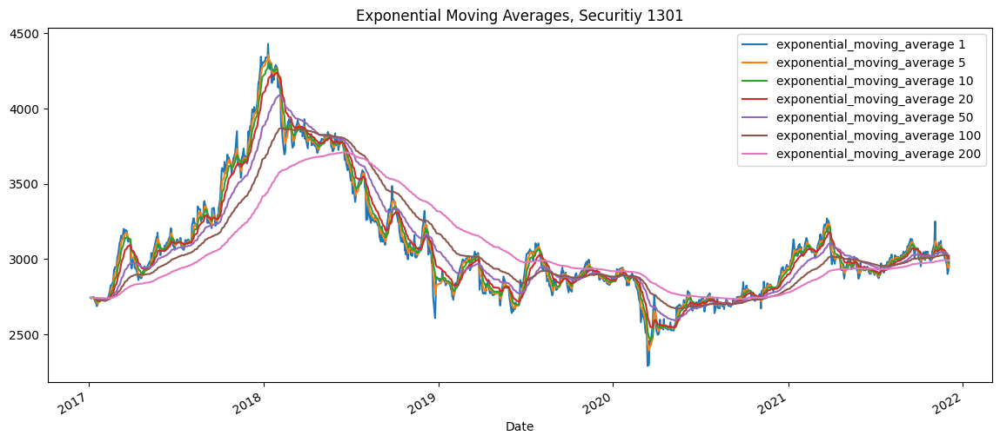

In [35]:
# exponential moving averages visualisation
example[exponential_moving_average].plot(figsize = (14, 6), title = "Exponential Moving Averages, Securitiy 1301")

In [36]:
# RSI using simple moving average
# removed 1 day calculation as it is not a very good representation
periods = [5, 10, 20, 50, 100, 200]
rsi_sma_periods = []
for period in periods:
    delta = example["AdjustedClose"].diff()
    up, down = delta.clip(lower = 0), -delta.clip(upper = 0)
    roll_up, roll_down = up.rolling(window = period).mean(), down.rolling(window = period).mean()
    rs = roll_up / roll_down
    rsi = 100 - (100 / (1 + rs))
    rsi_sma_periods.append(f"rsi_sma_period {period}")
    example.loc[:, f"rsi_sma_period {period}"] = rsi

<Axes: title={'center': 'Relative Strength Index using Simple Moving Average, Securitiy 1301'}, xlabel='Date'>

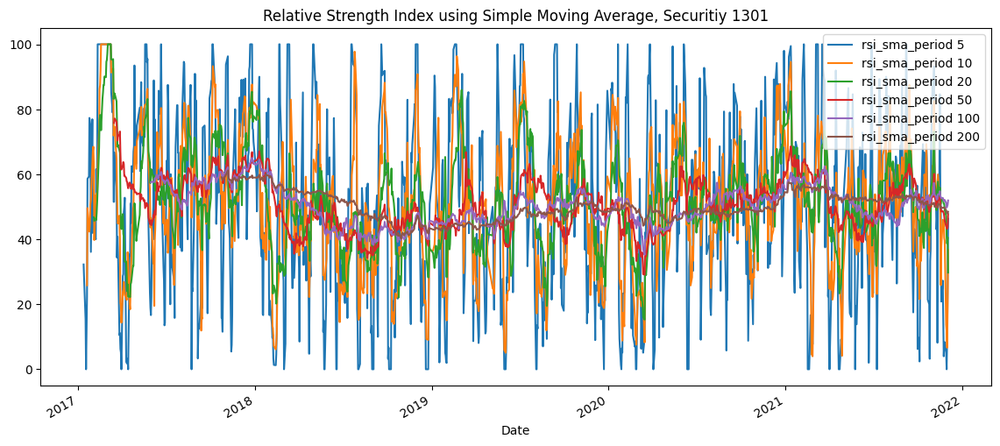

In [37]:
# visualisation of RSI SMA
example[rsi_sma_periods].plot(figsize = (14, 6), title = "Relative Strength Index using Simple Moving Average, Securitiy 1301")

In [38]:
# RSI using exponential moving average
# removed 1 day calculation as it is not a very good representation
periods = [5, 10, 20, 50, 100, 200]
rsi_ema_periods = []
for period in periods:
    delta = example["AdjustedClose"].diff()
    up, down = delta.clip(lower = 0), -delta.clip(upper = 0)
    roll_up, roll_down = up.ewm(span = period, adjust = False).mean(), down.ewm(span = period, adjust = False).mean()
    rs = roll_up / roll_down
    rsi = 100 - (100 / (1 + rs))
    rsi_ema_periods.append(f"rsi_ema_periods {period}")
    example.loc[:, f"rsi_ema_periods {period}"] = rsi

<Axes: title={'center': 'Relative Strength Index using Exponential Moving Average, Securitiy 1301'}, xlabel='Date'>

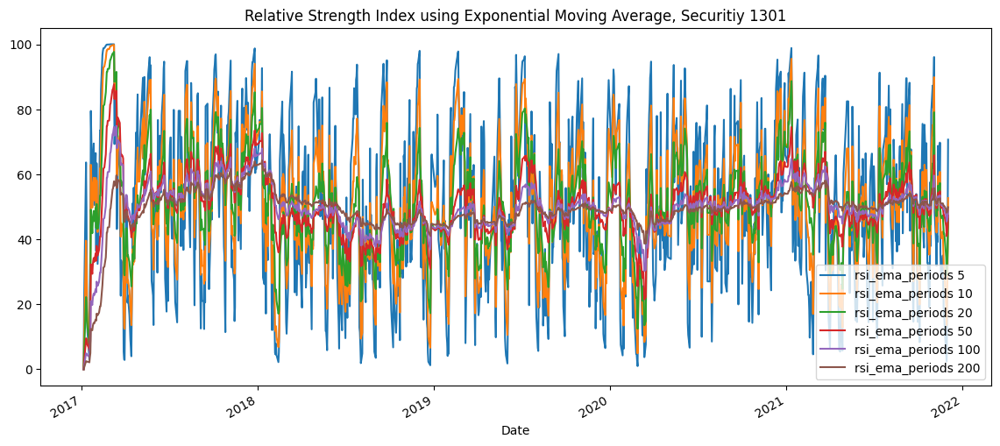

In [39]:
# visualisation of RSI EMA
example[rsi_ema_periods].plot(figsize = (14, 6), title = "Relative Strength Index using Exponential Moving Average, Securitiy 1301")

In [40]:
# On-balance volume

example["OBV"] = 0
example.loc[:, "OBV"] = example["Volume"].cumsum().where(example["AdjustedClose"].diff() > 0, -example["Volume"]).cumsum()

<Axes: title={'center': 'On-Balance Volume, Securitiy 1301'}, xlabel='Date'>

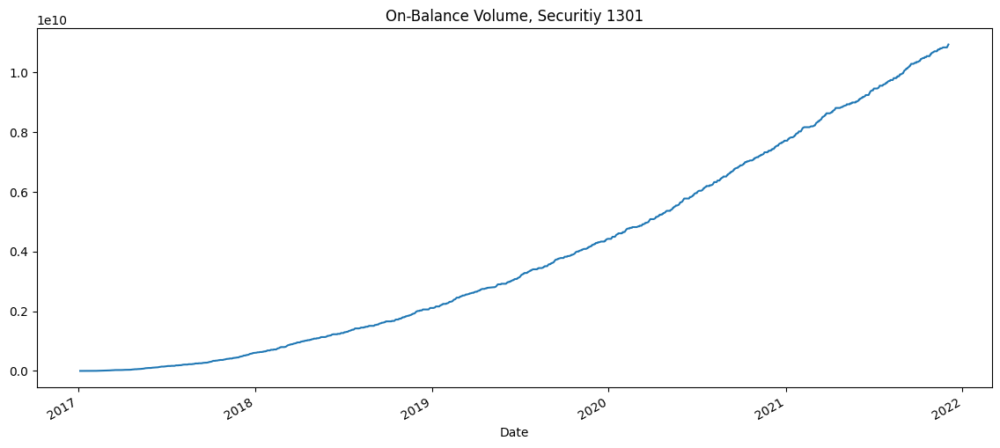

In [41]:
# visualisation of OBV
example["OBV"].plot(figsize = (14, 6), title = "On-Balance Volume, Securitiy 1301")

In [42]:
# MACD - 12 day period adjusted closing price - 26 day period adjusted closing price

example["MACD"] = example["AdjustedClose"].ewm(span = 12, adjust = False).mean() - example["AdjustedClose"].ewm(span = 26, adjust = False).mean()
example["MACD_Signal"] = example["MACD"].ewm(span = 9, adjust = False).mean()

<Axes: title={'center': 'MACD, Securitiy 1301'}, xlabel='Date'>

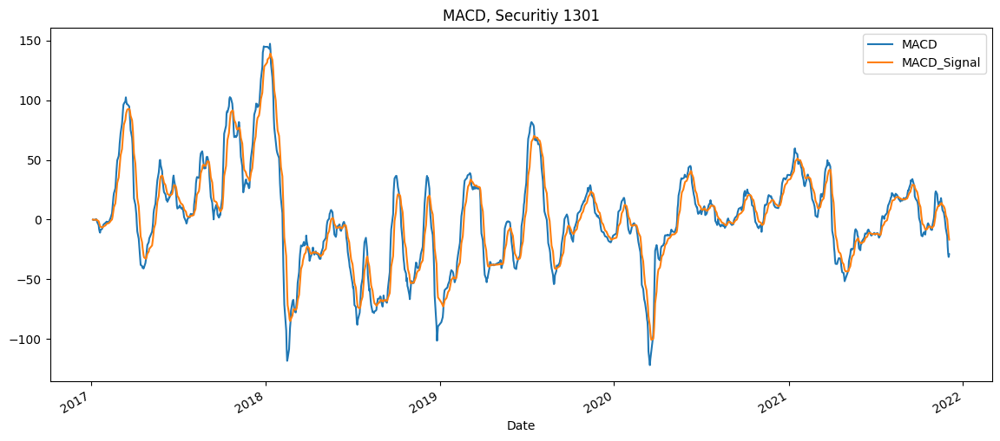

In [43]:
# visualisation of MACD
example[["MACD", "MACD_Signal"]].plot(figsize = (14, 6), title = "MACD, Securitiy 1301")

In [44]:
# Boiler bands - typically calculated using a 20 day simple moving average period as the middle then 2std above and below for upper and lower bands

example["middle_band"] = example["AdjustedClose"].rolling(window = 20).mean()
example["upper_band"] = example["middle_band"] + (example["AdjustedClose"].rolling(window = 20).std() * 2)
example["lower_band"] = example["middle_band"] - (example["AdjustedClose"].rolling(window = 20).std() * 2)

<Axes: title={'center': 'Bollinger Bands 20 Day Simple Moving Average, Securitiy 1301'}, xlabel='Date'>

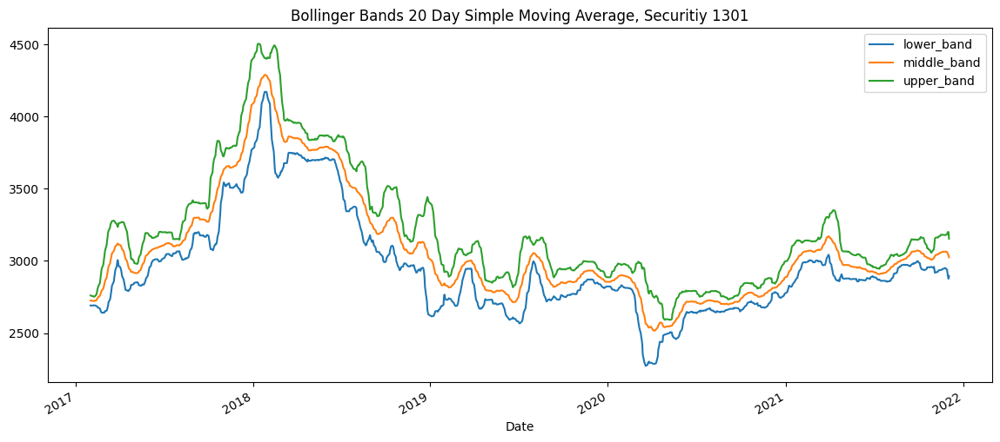

In [45]:
# visualisation of bollinger bands
example[["lower_band", "middle_band", "upper_band"]].plot(figsize = (14, 6), title = "Bollinger Bands 20 Day Simple Moving Average, Securitiy 1301")

In [46]:
df_price.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2332531 entries, 2017-01-04 to 2021-12-03
Data columns (total 13 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   RowId                       object 
 1   SecuritiesCode              int64  
 2   Open                        float64
 3   High                        float64
 4   Low                         float64
 5   Close                       float64
 6   Volume                      int64  
 7   AdjustmentFactor            float64
 8   ExpectedDividend            float64
 9   SupervisionFlag             bool   
 10  Target                      float64
 11  CumulativeAdjustmentFactor  float64
 12  AdjustedClose               float64
dtypes: bool(1), float64(9), int64(2), object(1)
memory usage: 233.6+ MB


3 code blocks below are also from the train demo notebook, but tailored towards my features.

In [47]:
# setting periods back to original
periods = [1, 5, 10, 20, 50, 100, 200]

def get_prediction_features(price, code):
    close_col = "AdjustedClose"
    features = price.loc[price["SecuritiesCode"] == code, ["SecuritiesCode", close_col, "High", "Low", "Volume", "Open", "Target"]].copy()
    
    delta = features[close_col].diff()
    up, down = delta.clip(lower = 0), -delta.clip(upper = 0)
    
    for period in periods:
        features[f"price_change {period}"] = features[close_col].pct_change(period)
        features[f"volatility {period}"] = features[close_col].diff().rolling(period).std()
        features[f"simple_moving_average {period}"] = features[close_col].rolling(window = period).mean()
        features[f"exponential_moving_average {period}"] = features[close_col].ewm(span = period, adjust = False).mean()
        
        roll_up, roll_down = up.rolling(window = period).mean(), down.rolling(window = period).mean()
        rs = roll_up / roll_down
        features[f"rsi_sma_periods {period}"] = 100 - (100 / (1 + rs))
        
        ema_roll_up, ema_roll_down = up.ewm(span = period, adjust = False).mean(), down.ewm(span = period, adjust = False).mean()
        ema_rs = ema_roll_up / ema_roll_down
        features[f"rsi_ema_periods {period}"] = 100 - (100 / (1 + ema_rs))
    
    features["MACD"] = features[close_col].ewm(span = 12, adjust = False).mean() - features[close_col].ewm(span = 26, adjust = False).mean()
    features["MACD_Signal"] = features["MACD"].ewm(span = 9, adjust = False).mean()
    features["middle_band"] = features[close_col].rolling(window = 20).mean()
    features["upper_band"] = features["middle_band"] + (features[close_col].rolling(window = 20).std() * 2)
    features["lower_band"] = features["middle_band"] - (features[close_col].rolling(window = 20).std() * 2)
    
    # filling data for nan and inf
    features = features.fillna(0)
    features = features.replace([np.inf, -np.inf], 0)
    
    return features

In [48]:
codes = sorted(df_price["SecuritiesCode"].unique())
len(codes)

2000

In [49]:
# generate feature
from tqdm import tqdm

buff = []
for code in tqdm(codes):
    feat = get_prediction_features(df_price, code)
    buff.append(feat)
feature = pd.concat(buff)

100%|██████████| 2000/2000 [02:11<00:00, 15.20it/s]


In [50]:
feature.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2332531 entries, 2017-01-04 to 2021-12-03
Data columns (total 54 columns):
 #   Column                          Dtype  
---  ------                          -----  
 0   SecuritiesCode                  int64  
 1   AdjustedClose                   float64
 2   High                            float64
 3   Low                             float64
 4   Volume                          int64  
 5   Open                            float64
 6   Target                          float64
 7   price_change 1                  float64
 8   volatility 1                    float64
 9   simple_moving_average 1         float64
 10  exponential_moving_average 1    float64
 11  rsi_sma_periods 1               float64
 12  rsi_ema_periods 1               float64
 13  price_change 5                  float64
 14  volatility 5                    float64
 15  simple_moving_average 5         float64
 16  exponential_moving_average 5    float64
 17  rsi_sma_peri

In [51]:
feature

,SecuritiesCode,AdjustedClose,High,Low,Volume,Open,Target,price_change 1,volatility 1,simple_moving_average 1,...,volatility 200,simple_moving_average 200,exponential_moving_average 200,rsi_sma_periods 200,rsi_ema_periods 200,MACD,MACD_Signal,middle_band,upper_band,lower_band
Date,,,,,,,,,,,,,,,,,,,,,
2017-01-04,1301,2742.0,2755.0,2730.0,31400,2734.0,0.000730,0.000000,0.0,2742.0,...,0.000000,0.000,2742.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000
2017-01-05,1301,2738.0,2747.0,2735.0,17900,2743.0,0.002920,-0.001459,0.0,2738.0,...,0.000000,0.000,2741.960199,0.000000,0.000000,-0.319088,-0.063818,0.00,0.000000,0.000000
2017-01-06,1301,2740.0,2744.0,2720.0,19900,2734.0,-0.001092,0.000730,0.0,2740.0,...,0.000000,0.000,2741.940695,0.000000,0.500000,-0.405906,-0.132235,0.00,0.000000,0.000000
2017-01-10,1301,2748.0,2754.0,2735.0,24200,2745.0,-0.005100,0.002920,0.0,2748.0,...,0.000000,0.000,2742.000986,0.000000,2.470200,0.168877,-0.072013,0.00,0.000000,0.000000
2017-01-11,1301,2745.0,2752.0,2737.0,9300,2748.0,-0.003295,-0.001092,0.0,2745.0,...,0.000000,0.000,2742.030827,0.000000,2.451811,0.377965,0.017983,0.00,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-29,9997,668.0,679.0,665.0,320800,678.0,0.026987,-0.029070,0.0,668.0,...,19.580605,988.960,902.545929,43.438596,40.810852,-31.758368,-27.000553,739.35,805.968395,672.731605
2021-11-30,9997,667.0,689.0,667.0,296300,670.0,-0.001460,-0.001497,0.0,667.0,...,19.551142,987.170,900.202189,43.683839,40.778897,-33.278316,-28.256106,732.80,800.882303,664.717697
2021-12-01,9997,685.0,688.0,660.0,339100,661.0,0.017544,0.026987,0.0,685.0,...,19.522459,985.355,898.060874,43.584305,41.610121,-32.654020,-29.135689,728.30,796.535197,660.064803


In [52]:
feature.isna().sum()

SecuritiesCode                    0
AdjustedClose                     0
High                              0
Low                               0
Volume                            0
Open                              0
Target                            0
price_change 1                    0
volatility 1                      0
simple_moving_average 1           0
exponential_moving_average 1      0
rsi_sma_periods 1                 0
rsi_ema_periods 1                 0
price_change 5                    0
volatility 5                      0
simple_moving_average 5           0
exponential_moving_average 5      0
rsi_sma_periods 5                 0
rsi_ema_periods 5                 0
price_change 10                   0
volatility 10                     0
simple_moving_average 10          0
exponential_moving_average 10     0
rsi_sma_periods 10                0
rsi_ema_periods 10                0
price_change 20                   0
volatility 20                     0
simple_moving_average 20    

# Model Prediction & Evaluation
___

This section will cover the prediction model of the target variable. A prediction score closer to the actual target score is more desirable. Sharpe ratio will be used as the primary evaluation metric.

I will be testing 2 models: LGBM and an Artificial Neural Network.

### Light Gradient-Boosting Machine (LGBM) Model

Function below provided by competition hosts to calculate daily spread returns and Sharpe ratio of the top and bottom ranked stock portfolios.

In [53]:
def calc_spread_return_sharpe(df: pd.DataFrame, portfolio_size: int = 200, toprank_weight_ratio: float = 2) -> float:
    """
    Args:
        df (pd.DataFrame): predicted results
        portfolio_size (int): # of equities to buy/sell
        toprank_weight_ratio (float): the relative weight of the most highly ranked stock compared to the least.
    Returns:
        (float): sharpe ratio
    """
    def _calc_spread_return_per_day(df, portfolio_size, toprank_weight_ratio):
        """
        Args:
            df (pd.DataFrame): predicted results
            portfolio_size (int): # of equities to buy/sell
            toprank_weight_ratio (float): the relative weight of the most highly ranked stock compared to the least.
        Returns:
            (float): spread return
        """
        assert df['Rank'].min() == 0
        assert df['Rank'].max() == len(df['Rank']) - 1
        weights = np.linspace(start=toprank_weight_ratio, stop=1, num=portfolio_size)
        purchase = (df.sort_values(by='Rank')['Target'][:portfolio_size] * weights).sum() / weights.mean()
        short = (df.sort_values(by='Rank', ascending=False)['Target'][:portfolio_size] * weights).sum() / weights.mean()
        return purchase - short

    buf = df.groupby('Date').apply(_calc_spread_return_per_day, portfolio_size, toprank_weight_ratio)
    sharpe_ratio = buf.mean() / buf.std()
    return sharpe_ratio

Function provided by competition hosts to assign stocks a rank based on prediction scores.

In [54]:
def set_rank(df):
    """
    Args:
        df (pd.DataFrame): including predict column
    Returns:
        df (pd.DataFrame): df with Rank
    """
    # sort records to set Rank
    df = df.sort_values("predict", ascending=False)
    # set Rank starting from 0
    df.loc[:, "Rank"] = np.arange(len(df["predict"]))
    return df

In [55]:
train_end = "2020-12-23"
test_start = "2020-12-28"

X_train = feature.loc[:train_end].drop("Target", axis = 1)
y_train = feature.loc[:train_end, "Target"].to_numpy()
X_test = feature.loc[test_start:].drop("Target", axis = 1)
y_test = feature.loc[test_start:, "Target"].to_numpy()

import random
import tensorflow as tf

# trying to have reproducable model results by setting random number variables to same seed each time
np.random.seed(42)
random.seed(42)
tf.random.set_seed(42)

In [56]:
# dropping features with low or 0 feature importance score
X_train = X_train.drop(["simple_moving_average 1", "volatility 1", "exponential_moving_average 1", "rsi_ema_periods 1", "middle_band", 
                        "rsi_sma_periods 1"], axis = 1)

X_test = X_test.drop(["simple_moving_average 1", "volatility 1", "exponential_moving_average 1", "rsi_ema_periods 1", "middle_band", 
                        "rsi_sma_periods 1"], axis = 1)

In [57]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1870531 entries, 2017-01-04 to 2020-12-23
Data columns (total 47 columns):
 #   Column                          Dtype  
---  ------                          -----  
 0   SecuritiesCode                  int64  
 1   AdjustedClose                   float64
 2   High                            float64
 3   Low                             float64
 4   Volume                          int64  
 5   Open                            float64
 6   price_change 1                  float64
 7   price_change 5                  float64
 8   volatility 5                    float64
 9   simple_moving_average 5         float64
 10  exponential_moving_average 5    float64
 11  rsi_sma_periods 5               float64
 12  rsi_ema_periods 5               float64
 13  price_change 10                 float64
 14  volatility 10                   float64
 15  simple_moving_average 10        float64
 16  exponential_moving_average 10   float64
 17  rsi_sma_peri

In [58]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 458000 entries, 2020-12-28 to 2021-12-03
Data columns (total 47 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   SecuritiesCode                  458000 non-null  int64  
 1   AdjustedClose                   458000 non-null  float64
 2   High                            458000 non-null  float64
 3   Low                             458000 non-null  float64
 4   Volume                          458000 non-null  int64  
 5   Open                            458000 non-null  float64
 6   price_change 1                  458000 non-null  float64
 7   price_change 5                  458000 non-null  float64
 8   volatility 5                    458000 non-null  float64
 9   simple_moving_average 5         458000 non-null  float64
 10  exponential_moving_average 5    458000 non-null  float64
 11  rsi_sma_periods 5               458000 non-null  float64
 12  

In [59]:
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

params = {
    "random_state": 42,
    "n_estimators": 500,
    "num_leaves": 256, #128
    "learning_rate": 0.1,
    "reg_alpha": 0.4
}

pred_model = LGBMRegressor(**params)
pred_model.fit(X_train, y_train)

y_pred = pred_model.predict(X_test)

result_LGBM = X_test[["SecuritiesCode"]].copy()
result_LGBM.loc[:, "predict"] = y_pred
result_LGBM.loc[:, "Target"] = y_test

result_LGBM = result_LGBM.sort_values(["Date", "predict"], ascending = [True, False])
result_LGBM = result_LGBM.groupby("Date").apply(set_rank)

lgbm_mae = mean_absolute_error(y_test, y_pred)
lgbm_mse = mean_squared_error(y_test, y_pred)
lgbm_rmse = np.sqrt(lgbm_mse)
lgbm_r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error (MAE): {lgbm_mae:.4f}")
print(f"Mean Squared Error (MSE): {lgbm_mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {lgbm_rmse:.4f}")
print(f"Coefficient of Determination (R^2 Score): {lgbm_r2:.4f}")

Mean Absolute Error (MAE): 0.0152
Mean Squared Error (MSE): 0.0005
Root Mean Squared Error (RMSE): 0.0221
Coefficient of Determination (R^2 Score): -0.0154


In [60]:
result_LGBM

SecuritiesCode   predict    Target  Rank
Date       Date                                                
2020-12-28 2020-12-28            6626  0.022348  0.035247     0
           2020-12-28            4490  0.016782  0.009050     1
           2020-12-28            4051  0.016400  0.001170     2
           2020-12-28            4168  0.016333  0.064220     3
           2020-12-28            3377  0.015893 -0.004662     4
...                               ...       ...       ...   ...
2021-12-03 2021-12-03            7747 -0.022380  0.065181  1995
           2021-12-03            6240 -0.023308  0.009653  1996
           2021-12-03            9107 -0.026774  0.038168  1997
           2021-12-03            7453 -0.027438  0.052571  1998
           2021-12-03            2317 -0.028899  0.024444  1999

[458000 rows x 4 columns]

In [61]:
# calc spread return sharpe
sr = calc_spread_return_sharpe(result_LGBM, portfolio_size=200)
print(f"Sharpe ratio: {sr:.4f}")

Sharpe ratio: 0.1501


LGBM model's score was 0.1501, meaning it scored within the top 21st percentile of competing models.

<BarContainer object of 4 artists>

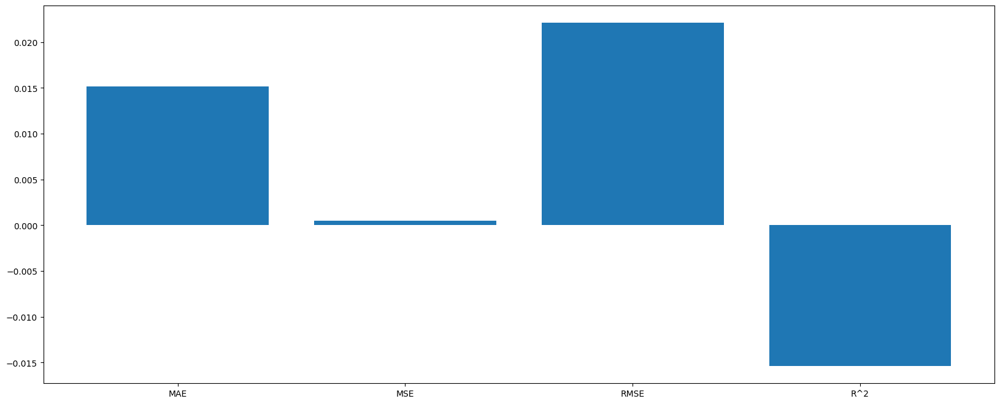

In [62]:
plt.figure(figsize=(20, 8))
plt.bar(["MAE", "MSE", "RMSE", "R^2"], [lgbm_mae, lgbm_mse, lgbm_rmse, lgbm_r2])

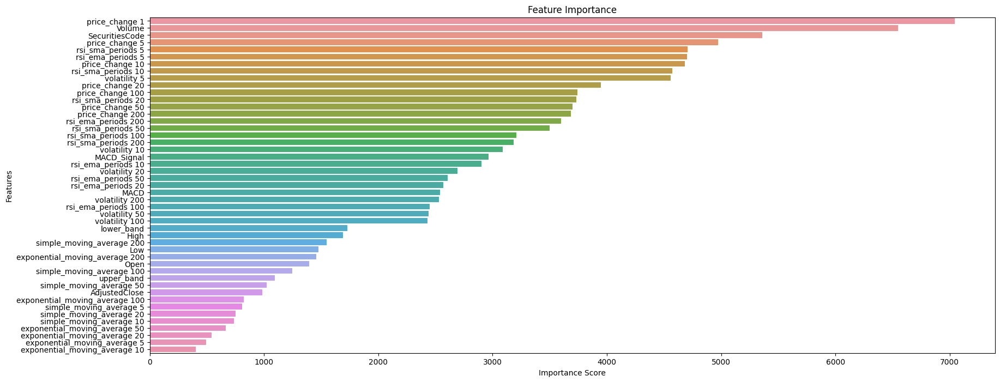

In [63]:
feature_importance = pred_model.feature_importances_

feature_importance_df = pd.DataFrame({
    "Feature": X_train.columns,
    "Importance": feature_importance
})

feature_importance_df = feature_importance_df.sort_values(by = "Importance", ascending = False)

plt.figure(figsize = (20, 8))
sns.barplot(x = "Importance", y = "Feature", data = feature_importance_df)
plt.title('Feature Importance')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.show()

## Artificial Neural Network (ANN)

In [64]:
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model = Sequential([
    Dense(128, activation = "relu", input_shape=(X_train_scaled.shape[1],)),
    Dense(128, activation = "relu"),
    Dropout(0.5),
    Dense(1)
])

learning_rate = 0.01

model.compile(optimizer = Adam(learning_rate), loss = "mse", metrics = ["mae"])

early_stopping = EarlyStopping(monitor='val_loss', patience=10)

history = model.fit(X_train_scaled, y_train, epochs = 50, validation_split = 0.2, batch_size = 2048, callbacks = early_stopping)

y_pred = model.predict(X_test_scaled).flatten()

result_ANN = X_test[["SecuritiesCode"]].copy()
result_ANN.loc[:, "predict"] = y_pred
result_ANN.loc[:, "Target"] = y_test

result_ANN = result_ANN.sort_values(["Date", "predict"], ascending = [True, False])
result_ANN = result_ANN.groupby("Date").apply(set_rank)

Epoch 1/50
731/731 [==============================] - 13s 16ms/step - loss: 0.0059 - mae: 0.0194 - val_loss: 4.0271e-04 - val_mae: 0.0135
Epoch 2/50
731/731 [==============================] - 12s 16ms/step - loss: 6.0444e-04 - mae: 0.0161 - val_loss: 4.0179e-04 - val_mae: 0.0134
Epoch 3/50
731/731 [==============================] - 12s 16ms/step - loss: 6.0437e-04 - mae: 0.0161 - val_loss: 4.0187e-04 - val_mae: 0.0134
Epoch 4/50
731/731 [==============================] - 12s 16ms/step - loss: 6.0442e-04 - mae: 0.0161 - val_loss: 4.0135e-04 - val_mae: 0.0134
Epoch 5/50
731/731 [==============================] - 11s 16ms/step - loss: 6.0443e-04 - mae: 0.0161 - val_loss: 4.0247e-04 - val_mae: 0.0135
Epoch 6/50
731/731 [==============================] - 11s 15ms/step - loss: 6.0455e-04 - mae: 0.0162 - val_loss: 4.0136e-04 - val_mae: 0.0134
Epoch 7/50
731/731 [==============================] - 12s 16ms/step - loss: 6.0439e-04 - mae: 0.0162 - val_loss: 4.0152e-04 - val_mae: 0.0134
Epoch 8/50

In [65]:
ann_mae = mean_absolute_error(y_test, y_pred)
ann_mse = mean_squared_error(y_test, y_pred)
ann_rmse = np.sqrt(ann_mse)
ann_r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error (MAE): {ann_mae:.4f}")
print(f"Mean Squared Error (MSE): {ann_mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {ann_rmse:.4f}")
print(f"Coefficient of Determination (R^2 Score): {ann_r2:.4f}")

Mean Absolute Error (MAE): 0.0151
Mean Squared Error (MSE): 0.0005
Root Mean Squared Error (RMSE): 0.0219
Coefficient of Determination (R^2 Score): -0.0002


In [66]:
result_ANN

SecuritiesCode   predict    Target  Rank
Date       Date                                                
2020-12-28 2020-12-28            1301  0.000168 -0.003377     0
           2020-12-28            7242  0.000168 -0.025144     1
           2020-12-28            7278  0.000168 -0.017067     2
           2020-12-28            7276  0.000168 -0.014045     3
           2020-12-28            7272  0.000168 -0.014520     4
...                               ...       ...       ...   ...
2021-12-03 2021-12-03            4499  0.000168  0.033708  1995
           2021-12-03            4495  0.000168  0.062422  1996
           2021-12-03            4493  0.000168  0.050183  1997
           2021-12-03            4490  0.000168  0.094961  1998
           2021-12-03            9997  0.000168  0.018414  1999

[458000 rows x 4 columns]

In [67]:
sr = calc_spread_return_sharpe(result_ANN, portfolio_size=200)
print(f"Sharpe ratio: {sr:.4f}")

Sharpe ratio: 0.1711


ANN's score was 0.1711, meaning it scored within the top 6th percentile of competing models.

<BarContainer object of 4 artists>

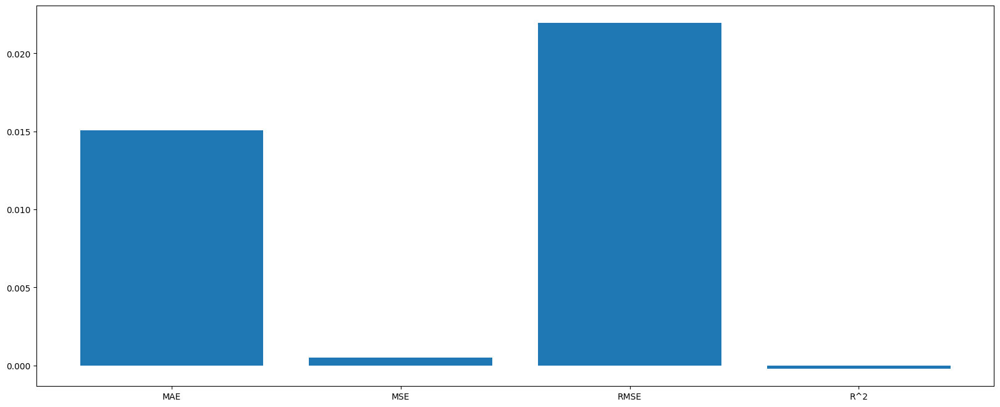

In [68]:
plt.figure(figsize=(20, 8))
plt.bar(["MAE", "MSE", "RMSE", "R^2"], [ann_mae, ann_mse, ann_rmse, ann_r2])